# Symmetric vs asymmetric parcellation


In [1]:
import sys
sys.path.append("..")
import ProbabilisticParcellation.evaluate as ev
import ProbabilisticParcellation.util as ut
import ProbabilisticParcellation.export_atlas as ea
import ProbabilisticParcellation.scripts.atlas_paper.parcel_hierarchy as ph
import ProbabilisticParcellation.scripts.atlas_paper.evaluate_atlas as eva
from Functional_Fusion.dataset import *
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sb
import pandas as pd
import torch as pt



In [2]:
figsize = (20, 20)
lut_dir = '/Volumes/diedrichsen_data$/data/Cerebellum/ProbabilisticParcellationModel/Atlases/'
_, cmap, labels = nt.read_lut(lut_dir +
                              'sym_MdPoNiIbWmDeSo_space-MNISymC2_K-68.lut')
models = [
    'Models_03/sym_MdPoNiIbWmDeSo_space-MNISymC2_K-68',
    'Models_03/asym_MdPoNiIbWmDeSo_space-MNISymC2_K-68_arrange-asym_sep-hem']

model_pair = ['Models_03/sym_MdPoNiIbWmDeSo_space-MNISymC2_K-68_reordered',
              'Models_03/asym_MdPoNiIbWmDeSo_space-MNISymC2_K-68_arrange-asym_sep-hem_reordered']

atlas = 'MNISymC2'

### Individual Parcellation

In [3]:
# prob_a = ev.parcel_individual(model_pair[0])
# prob_b = ev.parcel_individual(model_pair[1])

# load Uhats
prob_a = pt.load(f'{ut.model_dir}/Models/{model_pair[0]}_Uhat.pt')
prob_b = pt.load(f'{ut.model_dir}/Models/{model_pair[1]}_Uhat.pt')

parcel_a = pt.argmax(prob_a, dim=1) +1
parcel_b = pt.argmax(prob_b, dim=1) +1


OSError: [Errno 22] Invalid argument

In [177]:
parcel_a.shape

torch.Size([111, 18290])

In [ ]:
_, cmap_reordered, labels_reordered = nt.read_lut(lut_dir +
                              'sym_MdPoNiIbWmDeSo_space-MNISymC2_K-68_reordered.lut')
subject_labels = [f'Subject {i}' for i in range(1, parcel_b.shape[0] + 1)]


In [6]:
ari, ari_group = ev.ARI_voxelwise(
    parcel_a, parcel_b)


Calculating Adjusted Rand Index...
Computing WTA parcellation for individual 0...
Computing WTA parcellation for individual 1...
Computing WTA parcellation for individual 2...
Computing WTA parcellation for individual 3...
Computing WTA parcellation for individual 4...
Computing WTA parcellation for individual 5...
Computing WTA parcellation for individual 6...
Computing WTA parcellation for individual 7...
Computing WTA parcellation for individual 8...
Computing WTA parcellation for individual 9...
Computing WTA parcellation for individual 10...
Computing WTA parcellation for individual 11...
Computing WTA parcellation for individual 12...
Computing WTA parcellation for individual 13...
Computing WTA parcellation for individual 14...
Computing WTA parcellation for individual 15...
Computing WTA parcellation for individual 16...
Computing WTA parcellation for individual 17...
Computing WTA parcellation for individual 18...
Computing WTA parcellation for individual 19...
Computing WTA p

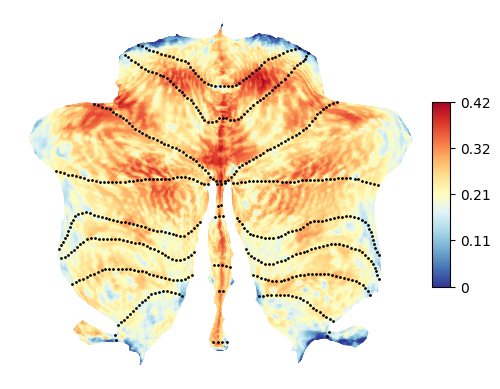

In [7]:
dtype = 'func'
cmap = 'RdYlBu_r'
labels = None,
colorbar = True
plt.figure()
ax = ut.plot_data_flat(ari_group, atlas,
                       dtype=dtype,
                       render='matplotlib',
                       cmap=cmap,
                       labels=labels,
                       colorbar=colorbar)
plt.show()

In [8]:
ri, ri_group = ev.ARI_voxelwise(
    parcel_a, parcel_b, adjusted=False)


Calculating Rand Index...
Computing WTA parcellation for individual 0...
Computing WTA parcellation for individual 1...
Computing WTA parcellation for individual 2...
Computing WTA parcellation for individual 3...
Computing WTA parcellation for individual 4...
Computing WTA parcellation for individual 5...
Computing WTA parcellation for individual 6...
Computing WTA parcellation for individual 7...
Computing WTA parcellation for individual 8...
Computing WTA parcellation for individual 9...
Computing WTA parcellation for individual 10...
Computing WTA parcellation for individual 11...
Computing WTA parcellation for individual 12...
Computing WTA parcellation for individual 13...
Computing WTA parcellation for individual 14...
Computing WTA parcellation for individual 15...
Computing WTA parcellation for individual 16...
Computing WTA parcellation for individual 17...
Computing WTA parcellation for individual 18...
Computing WTA parcellation for individual 19...
Computing WTA parcellati

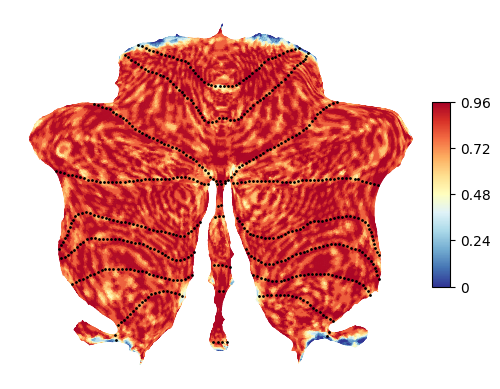

In [9]:
dtype = 'func'
cmap = 'RdYlBu_r'
labels = None,
colorbar = True
plt.figure()
ax = ut.plot_data_flat(ri_group, atlas,
                       dtype=dtype,
                       render='matplotlib',
                       cmap=cmap,
                       labels=labels,
                       colorbar=colorbar)
plt.show()


In [ ]:
corr, corr_group = ev.compare_probs(
    prob_a, prob_b, method='corr')


Calculating correlation between probability maps...
Comparing probabilistic parcellation for individual 0...
Comparing probabilistic parcellation for individual 1...
Comparing probabilistic parcellation for individual 2...
Comparing probabilistic parcellation for individual 3...
Comparing probabilistic parcellation for individual 4...
Comparing probabilistic parcellation for individual 5...
Comparing probabilistic parcellation for individual 6...
Comparing probabilistic parcellation for individual 7...
Comparing probabilistic parcellation for individual 8...
Comparing probabilistic parcellation for individual 9...
Comparing probabilistic parcellation for individual 10...
Comparing probabilistic parcellation for individual 11...
Comparing probabilistic parcellation for individual 12...
Comparing probabilistic parcellation for individual 13...
Comparing probabilistic parcellation for individual 14...
Comparing probabilistic parcellation for individual 15...
Comparing probabilistic parcel

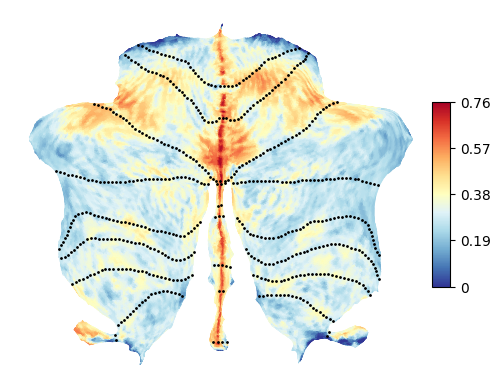

In [11]:
dtype = 'func'
cmap = 'RdYlBu_r'
labels = None,
colorbar = True
plt.figure()
ax = ut.plot_data_flat(corr_group, atlas,
                       dtype=dtype,
                       render='matplotlib',
                       cmap=cmap,
                       labels=labels,
                       colorbar=colorbar)
plt.show()


In [12]:

cosang, cosang_group = ev.compare_probs(
    prob_a, prob_b, method='cosang')


Calculating cosine similarity between probability maps...
Comparing probabilistic parcellation for individual 0...
Comparing probabilistic parcellation for individual 1...
Comparing probabilistic parcellation for individual 2...
Comparing probabilistic parcellation for individual 3...
Comparing probabilistic parcellation for individual 4...
Comparing probabilistic parcellation for individual 5...
Comparing probabilistic parcellation for individual 6...
Comparing probabilistic parcellation for individual 7...
Comparing probabilistic parcellation for individual 8...
Comparing probabilistic parcellation for individual 9...
Comparing probabilistic parcellation for individual 10...
Comparing probabilistic parcellation for individual 11...
Comparing probabilistic parcellation for individual 12...
Comparing probabilistic parcellation for individual 13...
Comparing probabilistic parcellation for individual 14...
Comparing probabilistic parcellation for individual 15...
Comparing probabilistic 

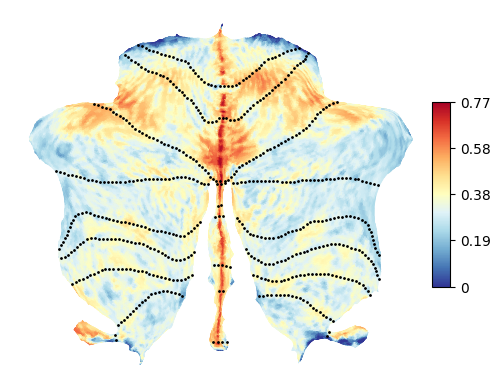

In [13]:
dtype = 'func'
cmap = 'RdYlBu_r'
labels = None,
colorbar = True
plt.figure()
ax = ut.plot_data_flat(cosang_group, atlas,
                       dtype=dtype,
                       render='matplotlib',
                       cmap=cmap,
                       labels=labels,
                       colorbar=colorbar)
plt.show()


In [14]:
# Save the results


### Compare symmetry by dataset

In [15]:
# Load number of participants
T = pd.read_csv(ut.base_dir + '/dataset_description.tsv', sep='\t')
n_subjects = T.num_particpants[:7].values
# Make index start at 0
sub_cumulative = np.cumsum(n_subjects)-1
print(sub_cumulative)


[ 23  31  37  50  66 103 111]


In [16]:
corr_group.min()

0.11479571

In [17]:
# Loop through n_subjects and group ari, ri, corr & cosang by dataset

ari_dataset = []
ri_dataset = []
corr_dataset = []
cosang_dataset = []
for i in range(len(n_subjects)):
    # print subjects to average to check subject indexing is correct
    
    if i == 0:
        print(sub_cumulative[i])
        ari_dataset.append(ari[:sub_cumulative[i]].mean(axis=0))
        ri_dataset.append(ri[:sub_cumulative[i]].mean(axis=0))
        corr_dataset.append(corr[:sub_cumulative[i]].mean(axis=0))
        cosang_dataset.append(cosang[:sub_cumulative[i]].mean(axis=0))
    else:
        print(sub_cumulative[i-1]+1, sub_cumulative[i])
        ari_dataset.append(
            ari[sub_cumulative[i-1]+1:sub_cumulative[i]].mean(axis=0))
        ri_dataset.append(
            ri[sub_cumulative[i-1]+1:sub_cumulative[i]].mean(axis=0))
        corr_dataset.append(
            corr[sub_cumulative[i-1]+1:sub_cumulative[i]].mean(axis=0))
        cosang_dataset.append(
            cosang[sub_cumulative[i-1]+1:sub_cumulative[i]].mean(axis=0))

23
24 31
32 37
38 50
51 66
67 103
104 111


<AxesSubplot: title={'center': 'Somatotopic'}>

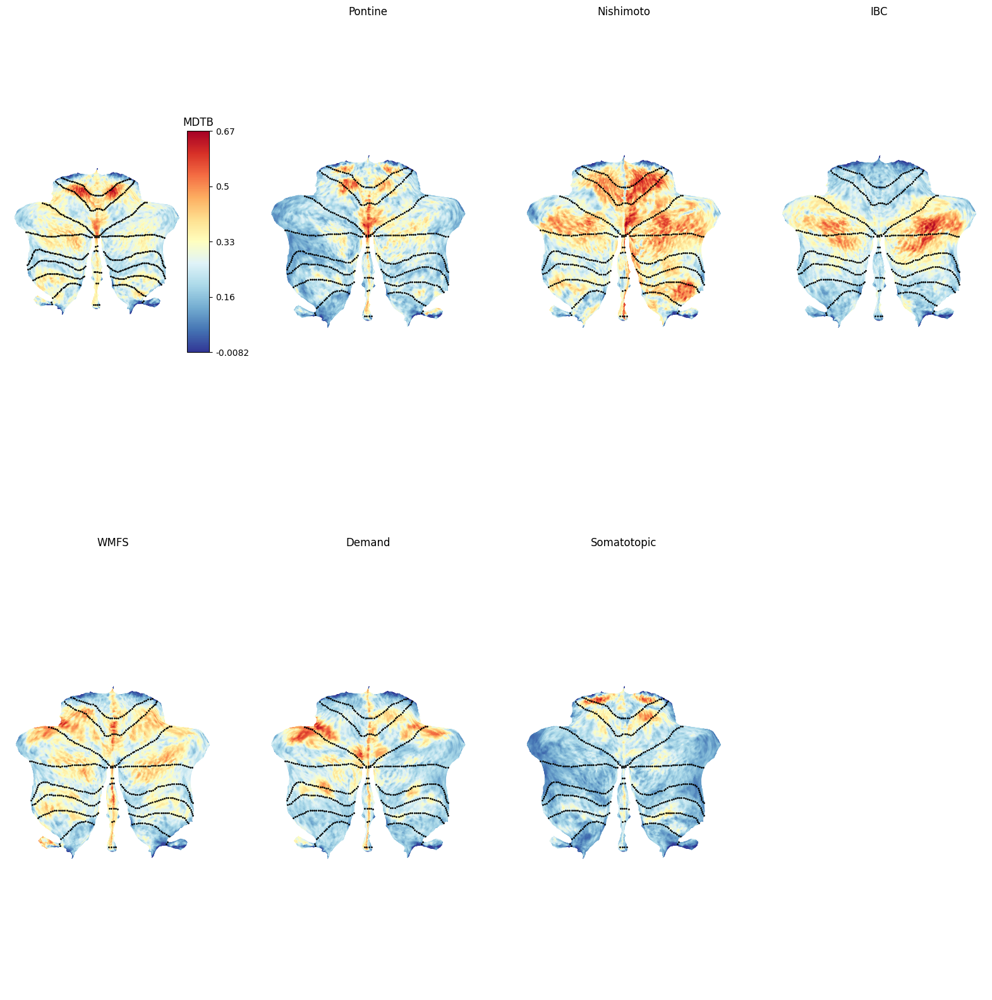

In [18]:
# Plot the results by dataset
plt.figure(figsize=(20, 20))
ut.plot_multi_flat(ari_dataset, 'MNISymC2',
                   grid=(2, 4),
                   dtype='func',
                   colorbar=True,
                   cmap='RdYlBu_r',
                   titles=T.name[:7].values)


<AxesSubplot: title={'center': 'Somatotopic'}>

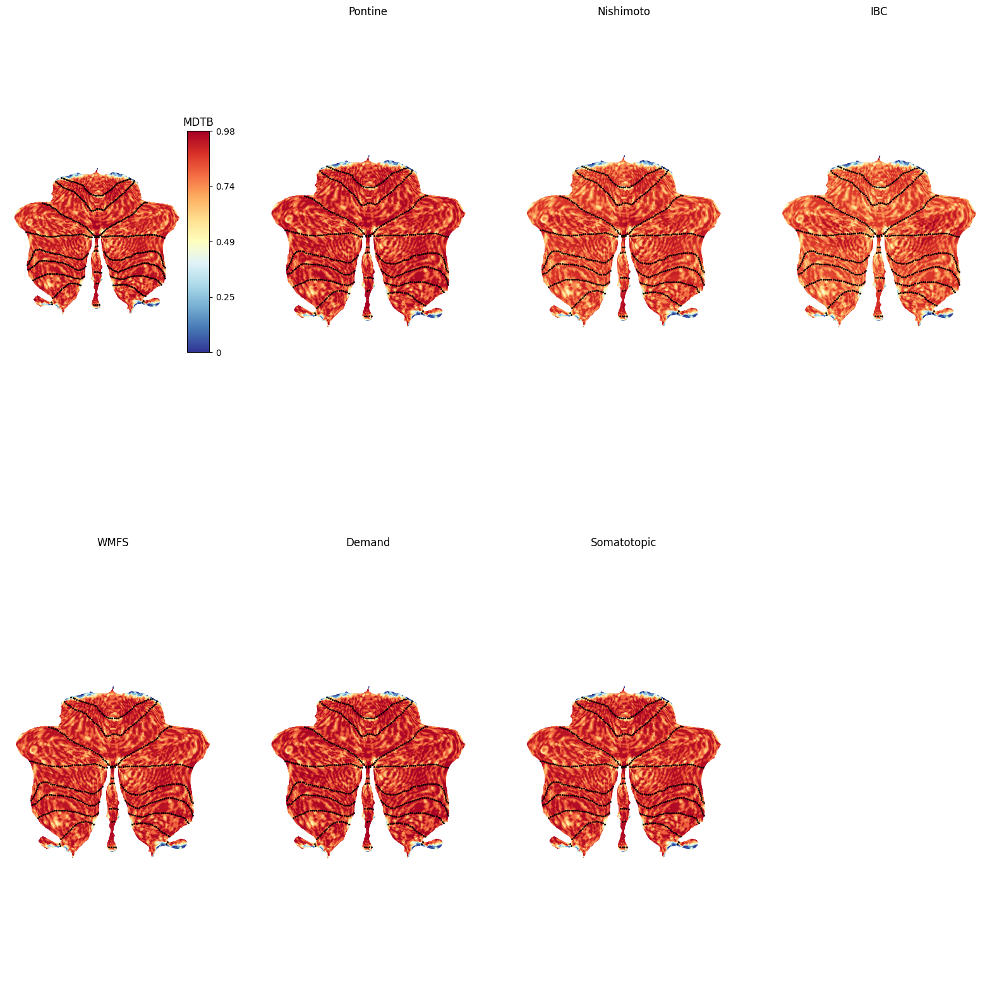

In [19]:
# Plot the results by dataset
plt.figure(figsize=(20, 20))
ut.plot_multi_flat(ri_dataset, 'MNISymC2',
                   grid=(2, 4),
                   dtype='func',
                   colorbar=True,
                   cmap='RdYlBu_r',
                   titles=T.name[:7].values)


<AxesSubplot: title={'center': 'Somatotopic'}>

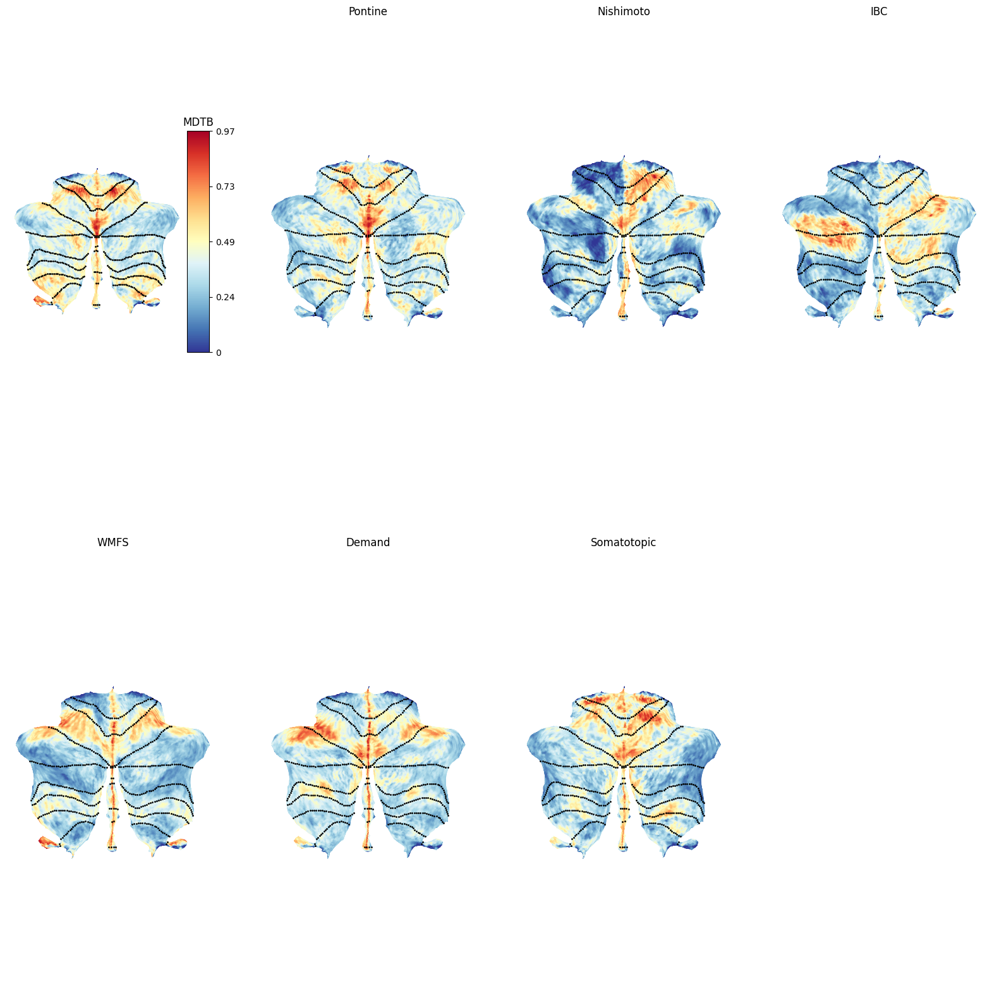

In [20]:
# Plot the results by dataset
plt.figure(figsize=(20, 20))
ut.plot_multi_flat(cosang_dataset, 'MNISymC2',
                   grid=(2, 4),
                   dtype='func',
                   colorbar=True,
                   cmap='RdYlBu_r',
                   titles=T.name[:7].values)


<AxesSubplot: title={'center': 'Somatotopic'}>

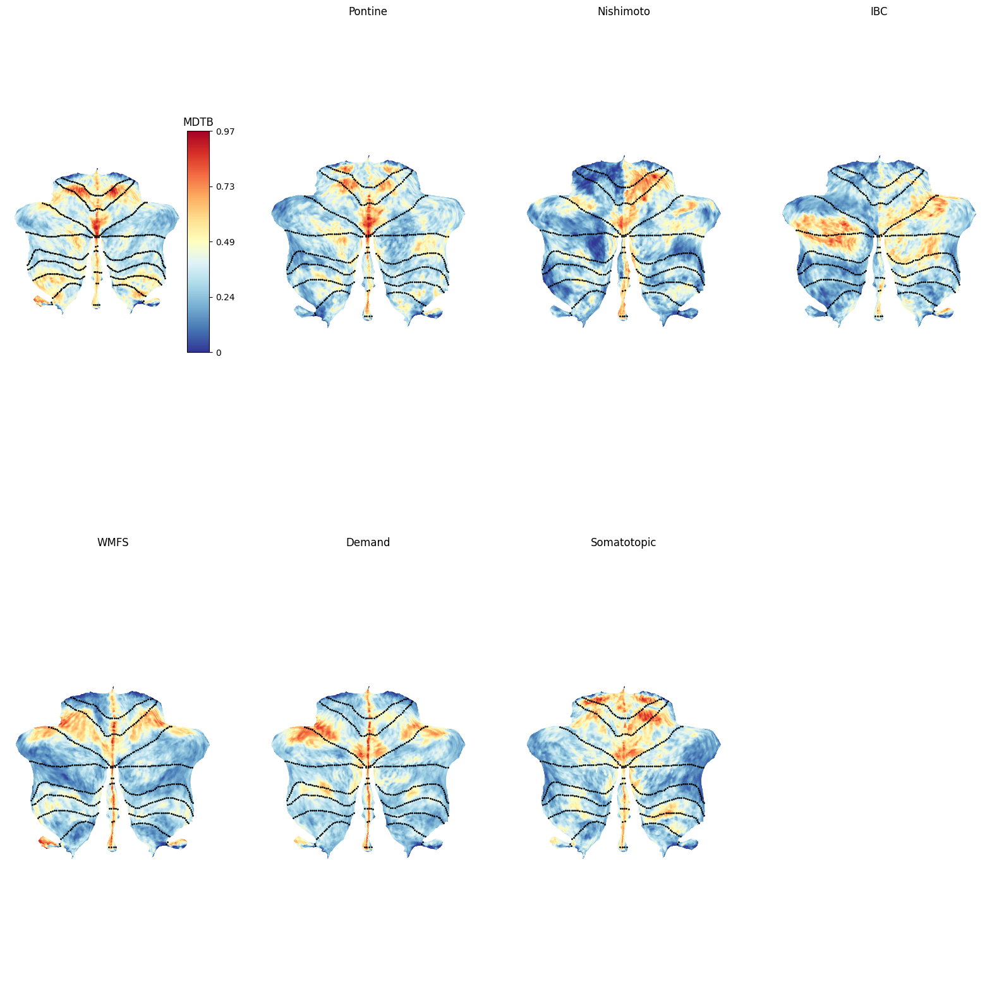

In [21]:
# Plot the results by dataset
plt.figure(figsize=(20, 20))
ut.plot_multi_flat(corr_dataset, 'MNISymC2',
                   grid=(2, 4),
                   dtype='func',
                   colorbar=True,
                   cmap='RdYlBu_r',
                   titles=T.name[:7].values)


<AxesSubplot: >

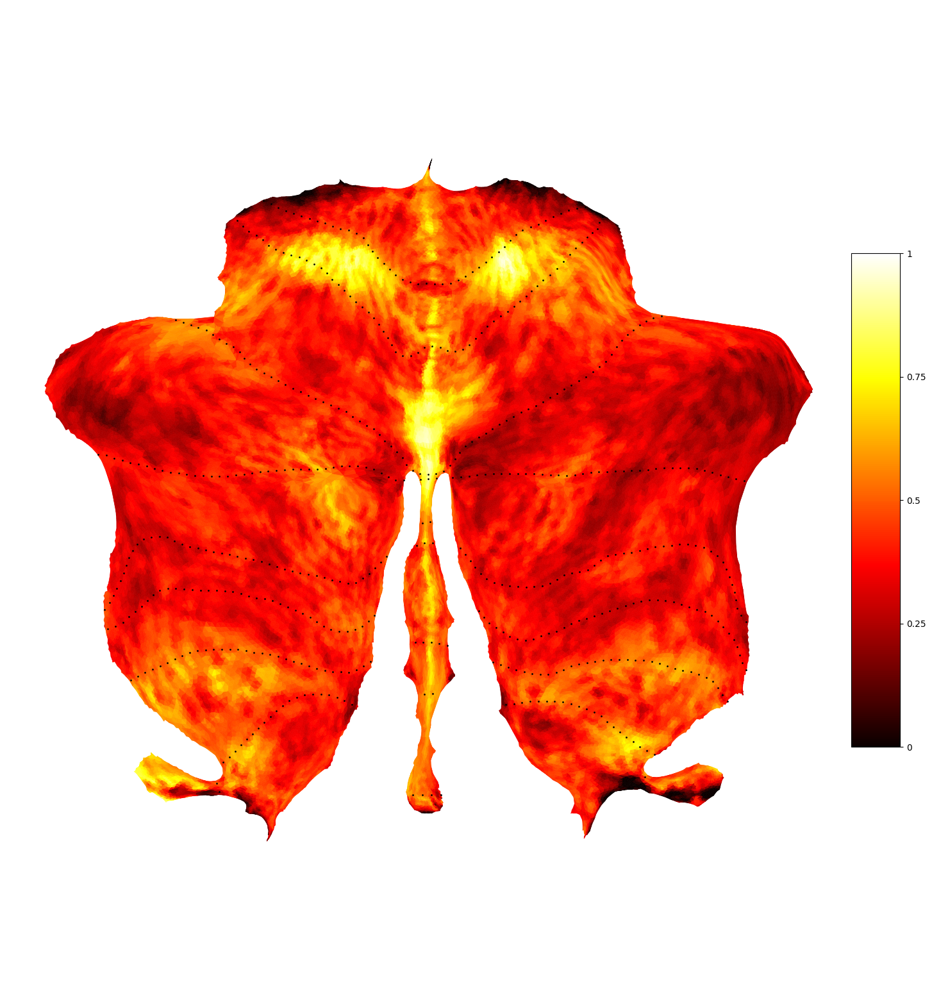

In [22]:
# Plot the results by dataset
plt.figure(figsize=(20, 20))
ut.plot_data_flat(corr_dataset[0], 'MNISymC2',
                   dtype='func',
                   colorbar=True,
                   cscale=(0, 1),
                   cmap='hot')


## Weigh correlation by kappa and number of subjects

In [23]:
# Import model a and model b
info_a, model_a = ut.load_batch_best(model_pair[0])
info_b, model_b = ut.load_batch_best(model_pair[1])
info_a = ut.recover_info(info_a, model_a, model_pair[0])
info_b = ut.recover_info(info_b, model_b, model_pair[1])




In [24]:
# Make subject index for each dataset that is as long as the number of sessions in that dataset
n_sessions = T.num_sess[:7].values

subjects_per_dataset = np.repeat(n_subjects, n_sessions)
# print(subjects_per_dataset)

for i, em in enumerate(model_a.emissions): 
    print(
        f'\nA: {i} {em.kappa.item()} kappa {em.V.shape[0]} tasks {subjects_per_dataset[i]} subjects')
    print(
        f'B: {i} {model_b.emissions[i].kappa.item()} kappa {model_b.emissions[i].V.shape[0]} tasks {subjects_per_dataset[i]} subjects')
    



A: 0 16.873830795288086 kappa 29 tasks 24 subjects
B: 0 16.873830795288086 kappa 29 tasks 24 subjects

A: 1 22.351341247558594 kappa 32 tasks 24 subjects
B: 1 22.351341247558594 kappa 32 tasks 24 subjects

A: 2 8.776419639587402 kappa 9 tasks 8 subjects
B: 2 8.776419639587402 kappa 9 tasks 8 subjects

A: 3 57.49275588989258 kappa 104 tasks 6 subjects
B: 3 57.49275588989258 kappa 104 tasks 6 subjects

A: 4 66.26618957519531 kappa 104 tasks 6 subjects
B: 4 66.26618957519531 kappa 104 tasks 6 subjects

A: 5 10.80732250213623 kappa 29 tasks 13 subjects
B: 5 10.80732250213623 kappa 29 tasks 13 subjects

A: 6 3.5933525562286377 kappa 11 tasks 13 subjects
B: 6 3.5933525562286377 kappa 11 tasks 13 subjects

A: 7 11.961953163146973 kappa 14 tasks 13 subjects
B: 7 11.961953163146973 kappa 14 tasks 13 subjects

A: 8 7.010955810546875 kappa 13 tasks 13 subjects
B: 8 7.010955810546875 kappa 13 tasks 13 subjects

A: 9 6.221834659576416 kappa 12 tasks 13 subjects
B: 9 6.221834659576416 kappa 12 task

In [25]:
ari_dataset = []
ri_dataset = []
corr_dataset = []
cosang_dataset = []
for i in range(len(n_subjects)):

    if i == 0:
        print(sub_cumulative[i])
        ari_dataset.append(ari[:sub_cumulative[i]].mean(axis=0))
        ri_dataset.append(ri[:sub_cumulative[i]].mean(axis=0))
        corr_dataset.append(corr[:sub_cumulative[i]].mean(axis=0))
        cosang_dataset.append(cosang[:sub_cumulative[i]].mean(axis=0))
    else:
        print(sub_cumulative[i - 1] + 1, sub_cumulative[i])
        ari_dataset.append(
            ari[sub_cumulative[i - 1] + 1:sub_cumulative[i]].mean(axis=0))
        ri_dataset.append(
            ri[sub_cumulative[i - 1] + 1:sub_cumulative[i]].mean(axis=0))
        corr_dataset.append(
            corr[sub_cumulative[i - 1] + 1:sub_cumulative[i]].mean(axis=0))
        cosang_dataset.append(
            cosang[sub_cumulative[i - 1] + 1:sub_cumulative[i]].mean(axis=0))


23
24 31
32 37
38 50
51 66
67 103
104 111


In [26]:
# Weigh similarity of each dataset by the within-dataset kappa and the within-dataset subject number            

# Weigh by kappa and np.sqrt of subjects
weights_a = [model_a.emissions[i].kappa.item() * np.sqrt(model_a.emissions[i].num_subj) for i in range(len(model_a.emissions))]
weights_b = [model_b.emissions[i].kappa.item() * np.sqrt(model_b.emissions[i].num_subj) for i in range(len(model_b.emissions))]
# Get average weight across model a and model b
weights = [(weights_a[i] + weights_b[i]) / 2 for i in range(len(weights_a))]

ari_dataset_weighted = [ari_dataset[i] *
                        weights_a[i] * weights_b[i] for i in range(len(ari_dataset))]
ri_dataset_weighted = [ri_dataset[i] *
                          weights_a[i] * weights_b[i] for i in range(len(ri_dataset))]
corr_dataset_weighted = [corr_dataset[i] *
                            weights_a[i] * weights_b[i] for i in range(len(corr_dataset))]
cosang_dataset_weighted = [cosang_dataset[i] *
                                weights_a[i] * weights_b[i] for i in range(len(cosang_dataset))]


# Concatenate tensors
ari_dataset_weighted = pt.stack(ari_dataset_weighted, dim=0)
ri_dataset_weighted = pt.stack(ri_dataset_weighted, dim=0)
corr_dataset_weighted = np.stack(corr_dataset_weighted, axis=0)
cosang_dataset_weighted = np.stack(cosang_dataset_weighted, axis=0)

# Calculate the weighted mean
ari_dataset_weighted = ari_dataset_weighted.mean(axis=0) / sum(weights)
ri_dataset_weighted = ri_dataset_weighted.mean(axis=0) / sum(weights)
corr_dataset_weighted = corr_dataset_weighted.mean(axis=0) / sum(weights)
cosang_dataset_weighted = cosang_dataset_weighted.mean(axis=0) / sum(weights)


In [27]:
corr_dataset_weighted.shape


(18290,)

<AxesSubplot: title={'center': 'Cosang'}>

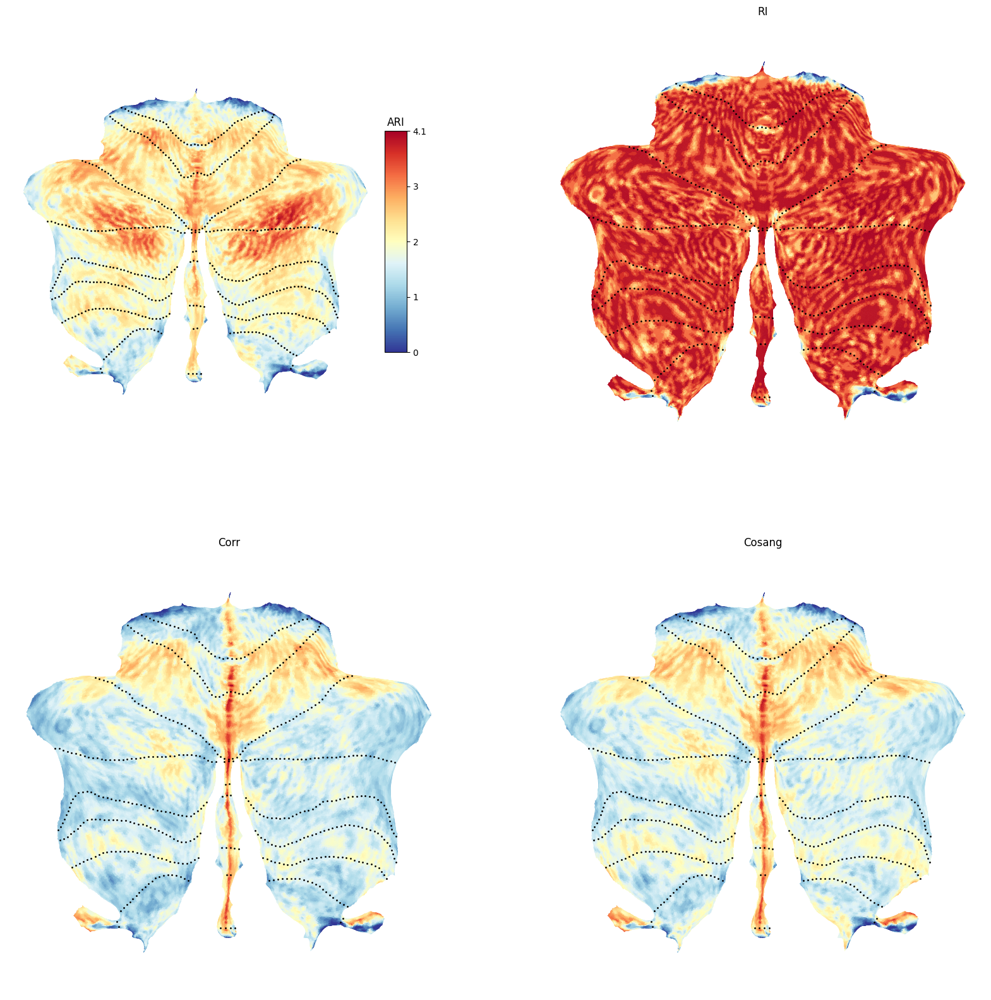

In [28]:
# Plot the results by dataset
similarities = [ari_dataset_weighted, ri_dataset_weighted, corr_dataset_weighted, cosang_dataset_weighted]
plt.figure(figsize=(20, 20))
ut.plot_multi_flat(similarities, 'MNISymC2',
                   grid=(2, 2),
                   dtype='func',
                   colorbar=True,
                   cmap='RdYlBu_r',
                   titles=['ARI', 'RI', 'Corr', 'Cosang'])


## Average only symmetric datasets (Md, Po, Wm, De, So)

<AxesSubplot: title={'center': 'Cosang'}>

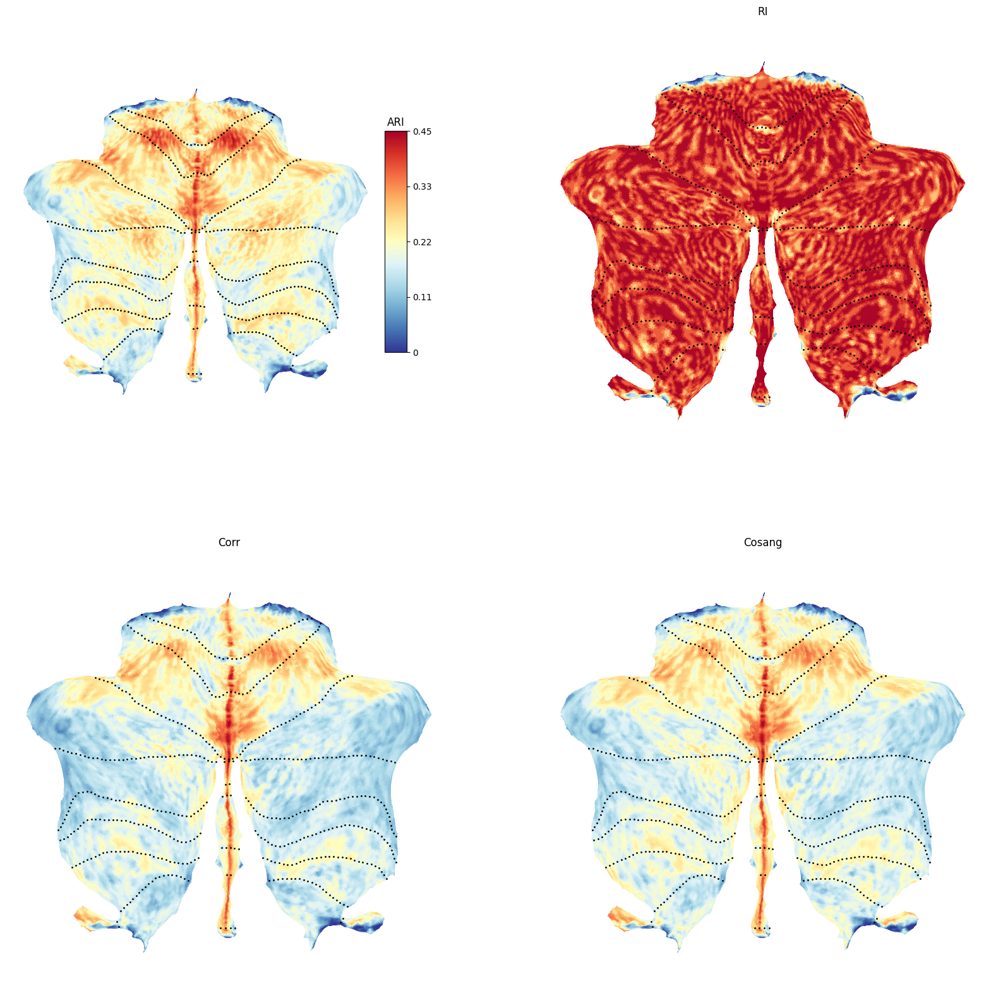

In [29]:
# Average symmetric datasets
ari_dataset_sym = ari_dataset[:2] + ari_dataset[4:7]
ri_dataset_sym = ri_dataset[:2] + ri_dataset[4:7]
corr_dataset_sym = corr_dataset[:2] + corr_dataset[4:7]
cosang_dataset_sym = cosang_dataset[:2] + cosang_dataset[4:7]


# Stack
ari_dataset_sym = pt.stack(ari_dataset_sym, dim=0)
ri_dataset_sym = pt.stack(ri_dataset_sym, dim=0)
corr_dataset_sym = np.stack(corr_dataset_sym, axis=0)
cosang_dataset_sym = np.stack(cosang_dataset_sym, axis=0)

# Average
ari_dataset_sym = ari_dataset_sym.mean(axis=0)
ri_dataset_sym = ri_dataset_sym.mean(axis=0)
corr_dataset_sym = corr_dataset_sym.mean(axis=0)
cosang_dataset_sym = cosang_dataset_sym.mean(axis=0)

# Plot the results averaged

similarities = [ari_dataset_sym, ri_dataset_sym, corr_dataset_sym, cosang_dataset_sym]
plt.figure(figsize=(20, 20))
ut.plot_multi_flat(similarities, 'MNISymC2',
                     grid=(2, 2),
                        dtype='func',
                        colorbar=True,
                        cmap='RdYlBu_r',
                        titles=['ARI', 'RI', 'Corr', 'Cosang'])



<AxesSubplot: >

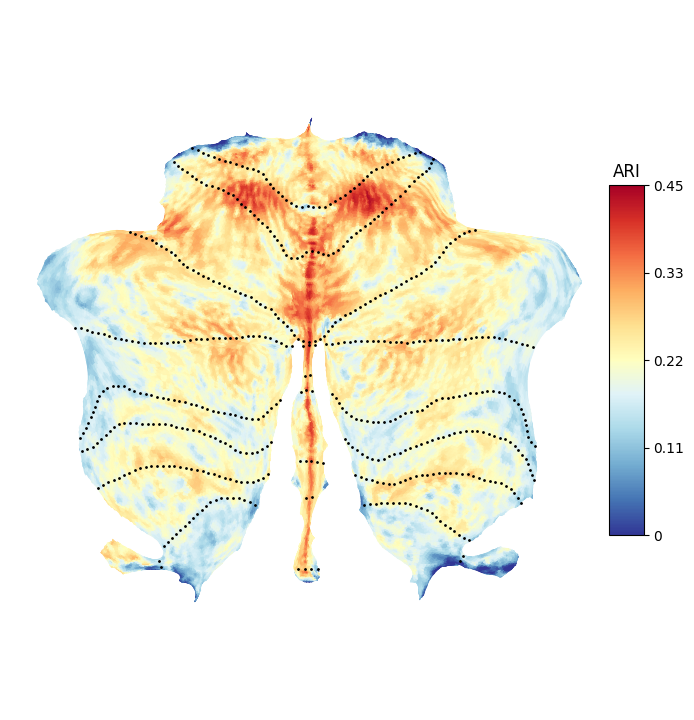

In [30]:

# similarities = [ari_dataset_sym, ri_dataset_sym,
                # corr_dataset_sym, cosang_dataset_sym]
plt.figure(figsize=(20, 20))
ut.plot_multi_flat([ari_dataset_sym], 'MNISymC2',
                   grid=(2, 2),
                   dtype='func',
                   colorbar=True,
                   cmap='RdYlBu_r',
                        titles=['ARI'])


<AxesSubplot: >

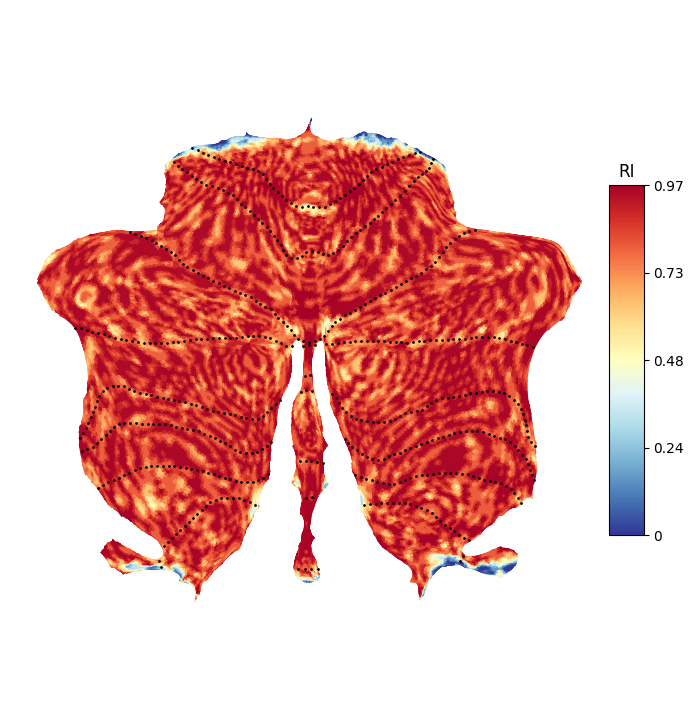

In [31]:
plt.figure(figsize=(20, 20))
ut.plot_multi_flat([ri_dataset_sym], 'MNISymC2',
                   grid=(2, 2),
                   dtype='func',
                   colorbar=True,
                   cmap='RdYlBu_r',
                        titles=['RI'])


<AxesSubplot: >

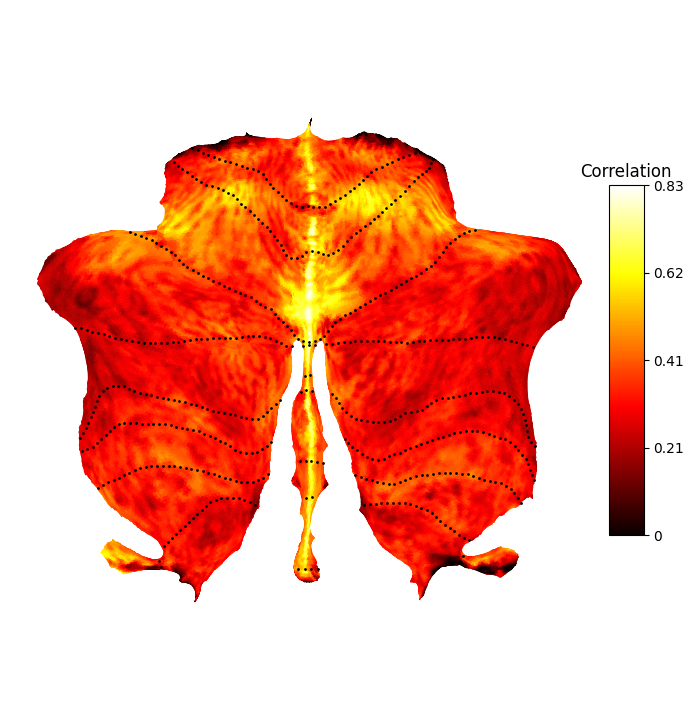

In [32]:
plt.figure(figsize=(20, 20))
ut.plot_multi_flat([corr_dataset_sym], 'MNISymC2',
                   grid=(2, 2),
                   dtype='func',
                   colorbar=True,
                   cmap='hot',
                        titles=['Correlation'])


<AxesSubplot: >

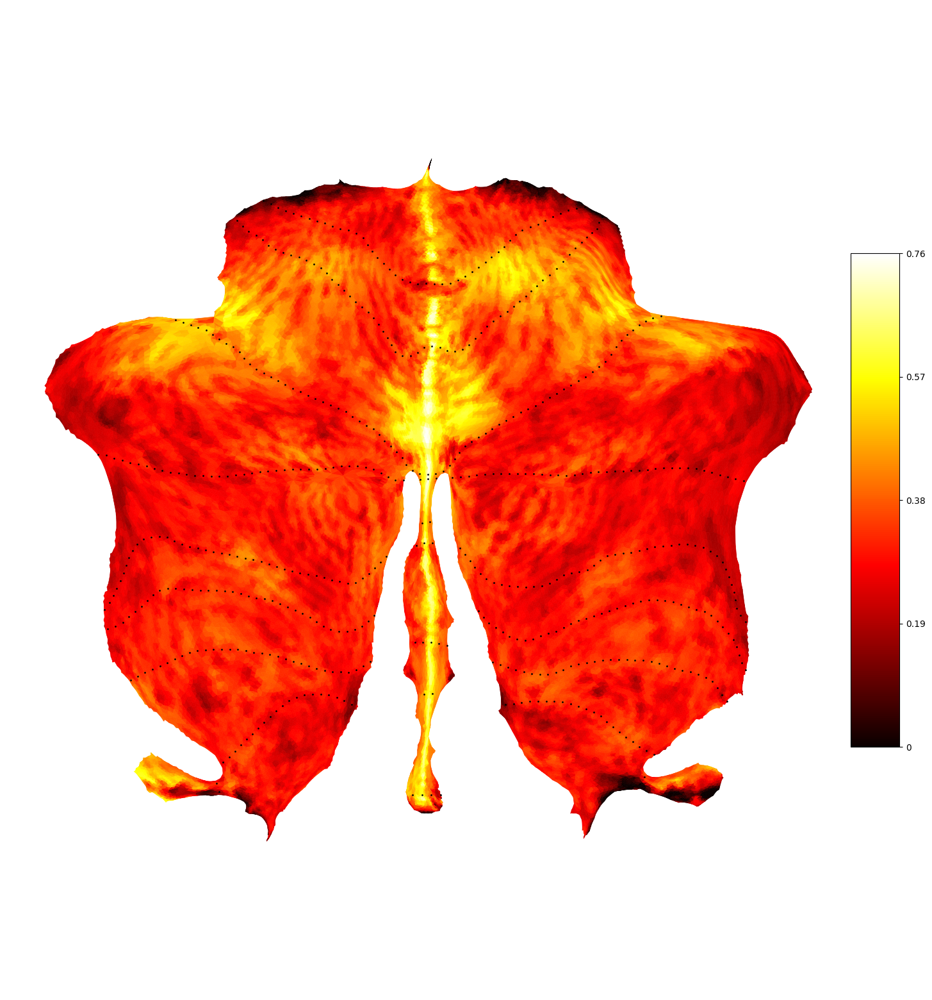

In [33]:
plt.figure(figsize=(20, 20))
ut.plot_data_flat(corr_group, 'MNISymC2',
                   dtype='func',
                   colorbar=True,
                   cmap='hot')


<AxesSubplot: >

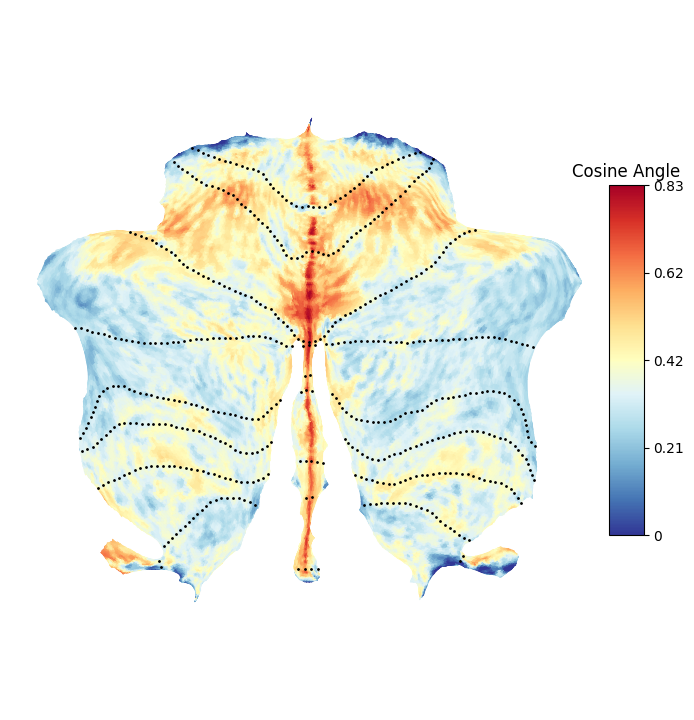

In [34]:
plt.figure(figsize=(20, 20))
ut.plot_multi_flat([cosang_dataset_sym], 'MNISymC2',
                   grid=(2, 2),
                   dtype='func',
                   colorbar=True,
                   cmap='RdYlBu_r',
                        titles=['Cosine Angle'])


<AxesSubplot: >

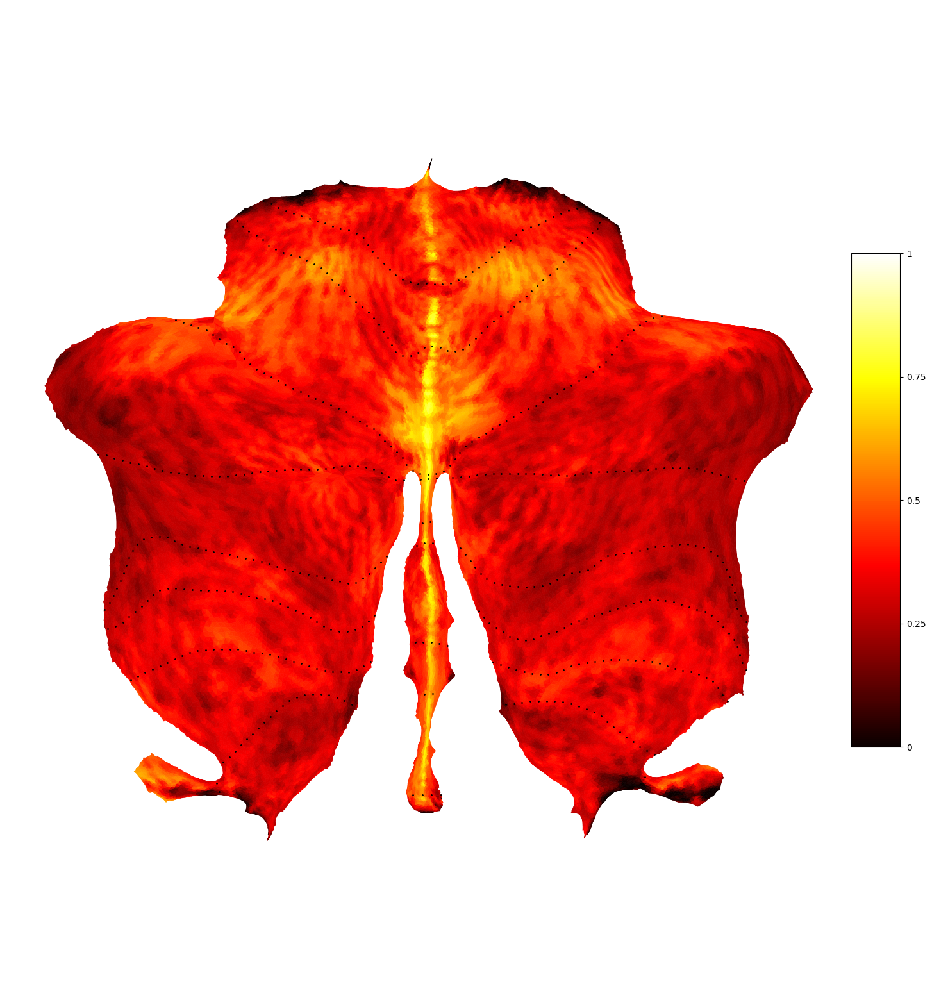

In [35]:
# Plot the results by dataset
plt.figure(figsize=(20, 20))
ut.plot_data_flat(corr_dataset_sym, 'MNISymC2',
                  dtype='func',
                  colorbar=True,
                  cscale=(0, 1),
                  cmap='hot')
